In [1]:
import os
import json
import h5py
import numpy as np

import robomimic
import robomimic.utils.file_utils as FileUtils
import robomimic.utils.env_utils as EnvUtils
import robomimic.utils.obs_utils as ObsUtils
import imageio
import tqdm
from robomimic.utils.file_utils import create_hdf5_filter_key

In [13]:
dataset_path ="/home/carl_lab/data_franka/drawer_ola/demo.hdf5"
f_org = h5py.File(dataset_path, "r")
demos = list(f_org["data"].keys())
# print(demos)
demos = list(f_org["data"]["demo_0"]["obs"].keys())
# print(demos)
demo=f_org["data"]["demo_0"]["obs"]['ee_states']
print(demo[0])

[ 0.99901405  0.02427884  0.03716773  0.          0.02398337 -0.99967726
  0.00837492  0.          0.03735907 -0.00747526 -0.99927395  0.
  0.4590456   0.0314399   0.26751544  1.        ]


['agentview_rgb', 'ee_states', 'eye_in_hand_rgb', 'gripper_states', 'joint_states']


283

In [4]:
lengths=[]
for demo_name in demos:
    demo=f_org['data'][demo_name]
    num_samples=demo.attrs['num_samples']
    lengths.append(num_samples)

lengths=np.array(lengths)

print('Number of demos: ', len(demos))
print('Max length: ', np.max(lengths))
print('Min length: ', np.min(lengths))
print('Mean length: ', np.mean(lengths))

Number of demos:  100
Max length:  564
Min length:  187
Mean length:  316.15


In [6]:
for demo_name in demos:
    demo=f_org['data'][demo_name]
    print(demo_name)

demo_0
demo_1
demo_10
demo_11
demo_12
demo_13
demo_14
demo_15
demo_16
demo_17
demo_18
demo_19
demo_2
demo_20
demo_21
demo_22
demo_23
demo_24
demo_25
demo_26
demo_27
demo_28
demo_29
demo_3
demo_30
demo_31
demo_32
demo_33
demo_34
demo_35
demo_36
demo_37
demo_38
demo_39
demo_4
demo_40
demo_41
demo_42
demo_43
demo_44
demo_45
demo_46
demo_47
demo_48
demo_49
demo_5
demo_50
demo_51
demo_52
demo_53
demo_54
demo_55
demo_56
demo_57
demo_58
demo_59
demo_6
demo_60
demo_61
demo_62
demo_63
demo_64
demo_65
demo_66
demo_67
demo_68
demo_69
demo_7
demo_70
demo_71
demo_72
demo_73
demo_74
demo_75
demo_76
demo_77
demo_78
demo_79
demo_8
demo_80
demo_81
demo_82
demo_83
demo_84
demo_85
demo_86
demo_87
demo_88
demo_89
demo_9
demo_90
demo_91
demo_92
demo_93
demo_94
demo_95
demo_96
demo_97
demo_98
demo_99


In [12]:
demo=f_org['data'][demos[0]]
print(demos[0])

demo_0


In [15]:
demo
list(demo.keys())

['actions', 'obs']

In [17]:
obs = demo['obs']
list(obs.keys())

['agentview_rgb',
 'ee_states',
 'eye_in_hand_rgb',
 'gripper_states',
 'joint_states']

In [28]:
obs = demo['obs']['agentview_rgb']
print(len(obs))

283


In [20]:
import matplotlib.pyplot as plt

In [ ]:
agentview_rgb = demo['obs']['agentview_rgb']
for i in range(0,len(obs),10): 
                
    # Convert the dataset to a NumPy array for plotting
    image_data = np.array(agentview_rgb[i])
    image_data = image_data[..., [2, 1, 0]]  # Switch R and B channels

    # Plot the image
    plt.imshow(image_data)
    plt.title("Agent View RGB")
    plt.axis('off')  # Optional: turn off axis
    plt.show()

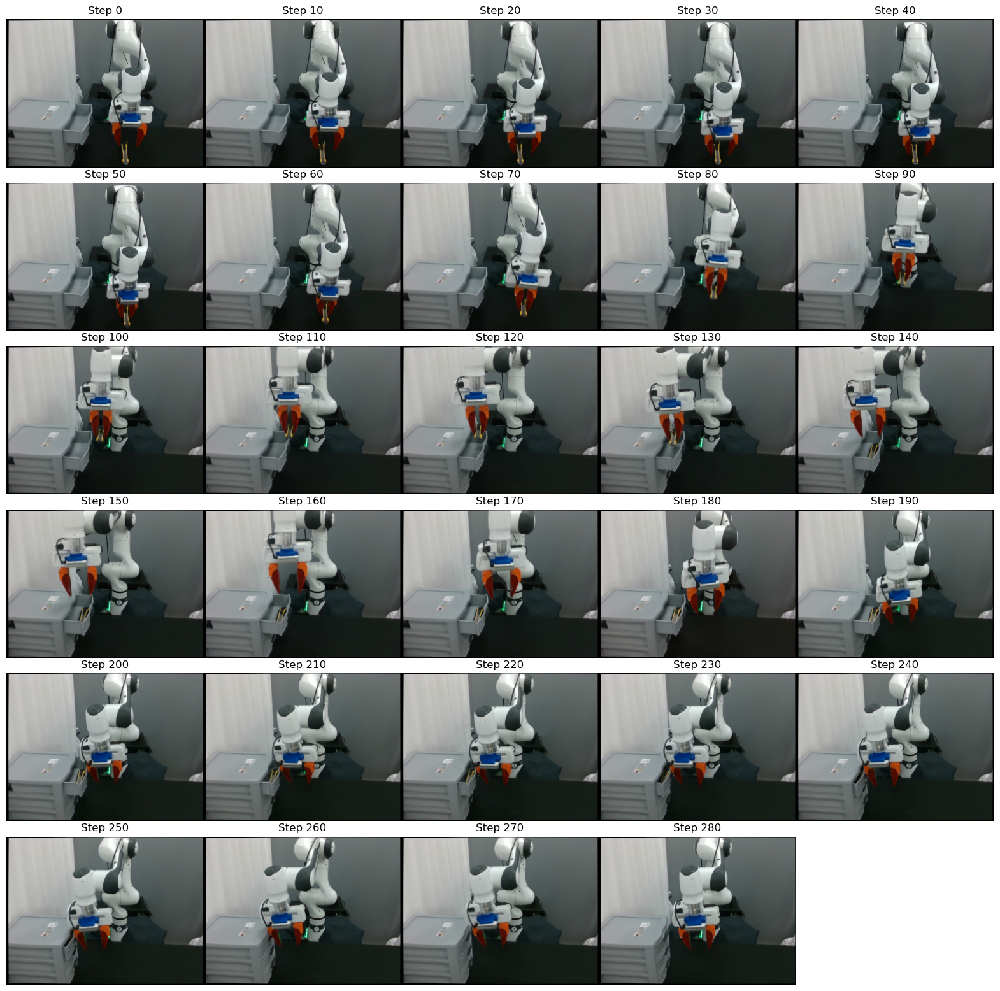

In [75]:
# Parameters for the display
step = 10  # Plot every 10th frame
frames_to_display = range(0, len(agentview_rgb), step)

# Set up the number of columns and rows
num_columns = min(5, len(frames_to_display))  # Limit to 5 columns for now
num_rows = int(np.ceil(len(frames_to_display) / num_columns))  # Ensure enough rows for all images

# Create a gridspec layout with no space between the images
fig = plt.figure(figsize=(20, 20))
gs = fig.add_gridspec(num_rows, num_columns, hspace=0, wspace=0)  # No space between subplots

# Loop through selected frames and plot them side by side
for idx, i in enumerate(frames_to_display):
    # Calculate row and column for the current image
    row = idx // num_columns
    col = idx % num_columns

    # Access and process the image
    image_data = np.array(agentview_rgb[i])
    image_data = image_data[..., [2, 1, 0]]  # Switch R and B channels

    # Add a subplot in the current grid position
    ax = fig.add_subplot(gs[row, col])

    # Plot the image in the respective subplot
    ax.imshow(image_data)
    ax.set_title(f"Step {i}")  # Add the step number as the title
    ax.axis('off')  # Hide axes for better visualization

# Show the images
plt.show()

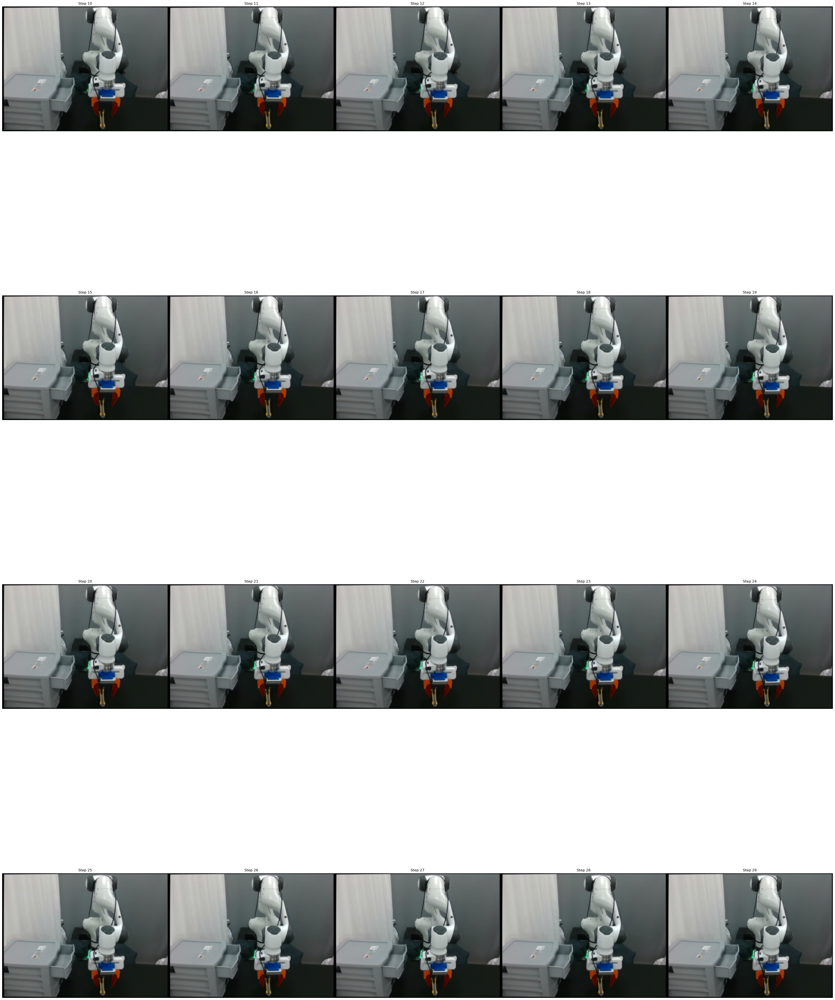

In [76]:
# Parameters for the display

frames_to_display = range(10, 30)

# Set up the number of columns and rows
num_columns = min(5, len(frames_to_display))  # Limit to 5 columns for now
num_rows = int(np.ceil(len(frames_to_display) / num_columns))  # Ensure enough rows for all images

# Create a gridspec layout with no space between the images
fig = plt.figure(figsize=(50, 70))
gs = fig.add_gridspec(num_rows, num_columns, hspace=0, wspace=0)  # No space between subplots

# Loop through selected frames and plot them side by side
for idx, i in enumerate(frames_to_display):
    # Calculate row and column for the current image
    row = idx // num_columns
    col = idx % num_columns

    # Access and process the image
    image_data = np.array(agentview_rgb[i])
    image_data = image_data[..., [2, 1, 0]]  # Switch R and B channels

    # Add a subplot in the current grid position
    ax = fig.add_subplot(gs[row, col])

    # Plot the image in the respective subplot
    ax.imshow(image_data)
    ax.set_title(f"Step {i}")  # Add the step number as the title
    ax.axis('off')  # Hide axes for better visualization

# Show the images
plt.show()

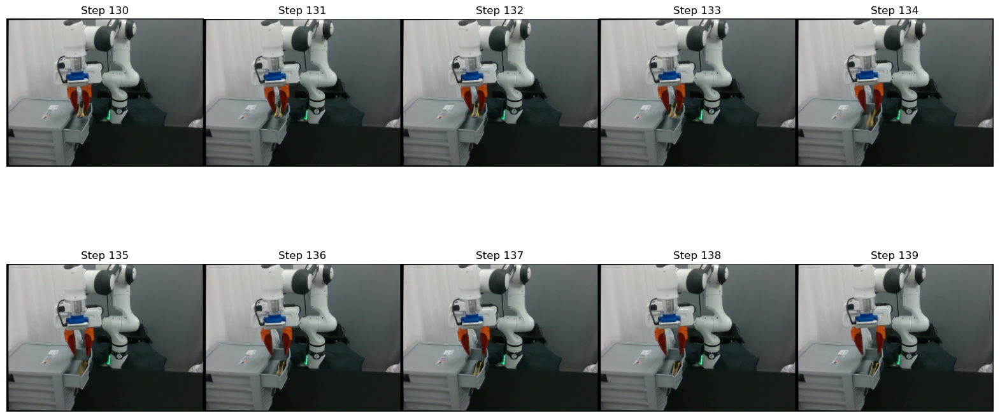

In [72]:
# Parameters for the display

frames_to_display = range(130, 140)

# Set up the number of columns and rows
num_columns = min(5, len(frames_to_display))  # Limit to 5 columns for now
num_rows = int(np.ceil(len(frames_to_display) / num_columns))  # Ensure enough rows for all images

# Create a gridspec layout with no space between the images
fig = plt.figure(figsize=(20, 10))
gs = fig.add_gridspec(num_rows, num_columns, hspace=0, wspace=0)  # No space between subplots

# Loop through selected frames and plot them side by side
for idx, i in enumerate(frames_to_display):
    # Calculate row and column for the current image
    row = idx // num_columns
    col = idx % num_columns

    # Access and process the image
    image_data = np.array(agentview_rgb[i])
    image_data = image_data[..., [2, 1, 0]]  # Switch R and B channels

    # Add a subplot in the current grid position
    ax = fig.add_subplot(gs[row, col])

    # Plot the image in the respective subplot
    ax.imshow(image_data)
    ax.set_title(f"Step {i}")  # Add the step number as the title
    ax.axis('off')  # Hide axes for better visualization

# Show the images
plt.show()

In [49]:
import cv2

In [54]:
frames_to_display = range(0, 70)

# Get the first image to extract dimensions (height, width)
first_image = np.array(agentview_rgb[frames_to_display[0]])
# first_image = first_image[..., [2, 1, 0]]  # Switch R and B channels
height, width, _ = first_image.shape

# Define the output video parameters
video_name = 'output_video.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec to use
fps = 30  # Frames per second
video_writer = cv2.VideoWriter(video_name, fourcc, fps, (width, height))

# Loop through selected frames and add them to the video
for i in frames_to_display:
    # Access and process the image
    image_data = np.array(agentview_rgb[i])
    # image_data = image_data[..., [2, 1, 0]]  # Switch R and B channels

    # Write the image to the video
    video_writer.write(image_data)

# Release the video writer to finalize the video
video_writer.release()

print(f"Video saved as {video_name}")

Video saved as output_video.mp4


In [58]:
ee_states = demo['obs']['ee_states']
gripper_states = demo['obs']['gripper_states']

print(ee_states[70])

closed = print(gripper_states[70])

open = print(gripper_states[0])

# [0.01599837]
# [0.07852682]


[ 0.99044745 -0.02853905  0.13490489  0.         -0.03803309 -0.9969375
  0.06833059  0.          0.13254166 -0.07280871 -0.98849967  0.
  0.46867094  0.03433737  0.29299241  1.        ]
[0.01599837]
[0.07852682]


In [63]:
ee_states = demo['obs']['ee_states']
gripper_states = demo['obs']['gripper_states']

print(ee_states[70])

ee_states_at_obj = ee_states[50]
ee_states_higher = ee_states[70]

# [0.01599837]
# [0.07852682]

[ 0.99044745 -0.02853905  0.13490489  0.         -0.03803309 -0.9969375
  0.06833059  0.          0.13254166 -0.07280871 -0.98849967  0.
  0.46867094  0.03433737  0.29299241  1.        ]


In [67]:
print(ee_states_at_obj[0])
print(ee_states_at_obj[1])
print(ee_states_at_obj[2])

0.9969080667632042
0.05565394811176305
-0.05546990403347099


In [68]:
print(ee_states_higher[0])
print(ee_states_higher[1])
print(ee_states_higher[2])

0.990447453294232
-0.02853905112127275
0.13490489463146135
